In [24]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn import metrics
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [2]:
df = pd.read_csv("instagramStuff.csv")
df

,Users,Number of Posts,Number of Followers,Number of Followings,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts,Gender,Unnamed: 9
0,User-1,486,279,19,15,10,17,0,m,NaN
1,User-2,401,"5,509",342,360,440,428,0,f,NaN
2,User-3,463,453,293,65,68,149,4,f,NaN
3,User-4,154,"1,231","1,477",53,22,35,3,m,NaN
4,User-5,786,"9,620",421,623,1299,544,0,m,NaN
...,...,...,...,...,...,...,...,...,...,...
995,User-996,"2,599","2,684","7,300",19,55,44,0,f,NaN
996,User-997,"2,284","4,020","2,978",160,164,200,6,f,NaN
997,User-998,164,"2,326","6,920",37,29,48,7,f,NaN
998,User-999,89,286,715,30,6,18,4,f,NaN


In [3]:
df = df.drop(['Users'], axis = 1)
df = df.drop(['Unnamed: 9'], axis = 1)
df.head()

,Number of Posts,Number of Followers,Number of Followings,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts,Gender
0,486,279,19,15,10,17,0,m
1,401,"5,509",342,360,440,428,0,f
2,463,453,293,65,68,149,4,f
3,154,"1,231","1,477",53,22,35,3,m
4,786,"9,620",421,623,1299,544,0,m


In [4]:
df.describe()

,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts
count,1000.000000,1000.000000,1000.000000,1000.000000
mean,114.621000,112.477000,114.923000,4.014000
std,197.677054,192.674074,202.001628,3.180239
min,0.000000,0.000000,0.000000,0.000000
25%,20.000000,19.000000,19.000000,1.000000
50%,47.500000,51.000000,51.000000,4.000000
75%,119.500000,116.000000,119.500000,7.000000
max,1620.000000,1956.000000,1806.000000,9.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Number of Posts                                           1000 non-null   object
 1   Number of Followers                                       1000 non-null   object
 2   Number of Followings                                      1000 non-null   object
 3   Number of Likes for the Tenth Previous Post               1000 non-null   int64 
 4   Number of Likes for the Eleventh Previous Post            1000 non-null   int64 
 5   Number of Likes for the Twelfth Previous Post             1000 non-null   int64 
 6   Number of Self-Presenting Posts from Nine Previous Posts  1000 non-null   int64 
 7    Gender                                                   1000 non-null   object
dtypes: int64(4), object(4)
memory 

In [6]:
for i in df.columns:
    df[i] = df[i].fillna(df[i].mode()[0])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 8 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Number of Posts                                           1000 non-null   object
 1   Number of Followers                                       1000 non-null   object
 2   Number of Followings                                      1000 non-null   object
 3   Number of Likes for the Tenth Previous Post               1000 non-null   int64 
 4   Number of Likes for the Eleventh Previous Post            1000 non-null   int64 
 5   Number of Likes for the Twelfth Previous Post             1000 non-null   int64 
 6   Number of Self-Presenting Posts from Nine Previous Posts  1000 non-null   int64 
 7    Gender                                                   1000 non-null   object
dtypes: int64(4), object(4)
memory 

In [7]:
objectDict = {}
for i in df.columns:
    if df[i].dtype == 'object':
        objectDict[i] = pd.Series(np.unique(df[i]))
objectDict

{'Number of Posts': 0      1,001
 1      1,012
 2      1,024
 3      1,073
 4      1,084
        ...  
 522      982
 523      985
 524      986
 525       99
 526      998
 Length: 527, dtype: object,
 'Number of Followers': 0      1,001
 1      1,002
 2      1,009
 3      1,011
 4      1,012
        ...  
 818      984
 819      990
 820      991
 821      995
 822      999
 Length: 823, dtype: object,
 'Number of Followings': 0      1,008
 1      1,010
 2      1,020
 3      1,023
 4      1,026
        ...  
 839      984
 840      985
 841      992
 842      996
 843      999
 Length: 844, dtype: object,
 ' Gender': 0    f
 1    m
 dtype: object}

In [8]:
for i in objectDict.keys():
    for j in list(objectDict[i].index):
        df[i] = df[i].replace(objectDict[i][j], j)
df

,Number of Posts,Number of Followers,Number of Followings,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts,Gender
0,349,352,190,15,10,17,0,1
1,309,534,421,360,440,428,0,0
2,338,501,341,65,68,149,4,0
3,104,61,89,53,22,35,3,1
4,463,783,518,623,1299,544,0,1
...,...,...,...,...,...,...,...,...
995,156,282,719,19,55,44,0,0
996,149,454,299,160,164,200,6,0
997,114,251,671,37,29,48,7,0
998,502,357,747,30,6,18,4,0


In [9]:
px.box(df)

Text(0.5, 1.0, '\nRaw Data Correlation Matrix\n')

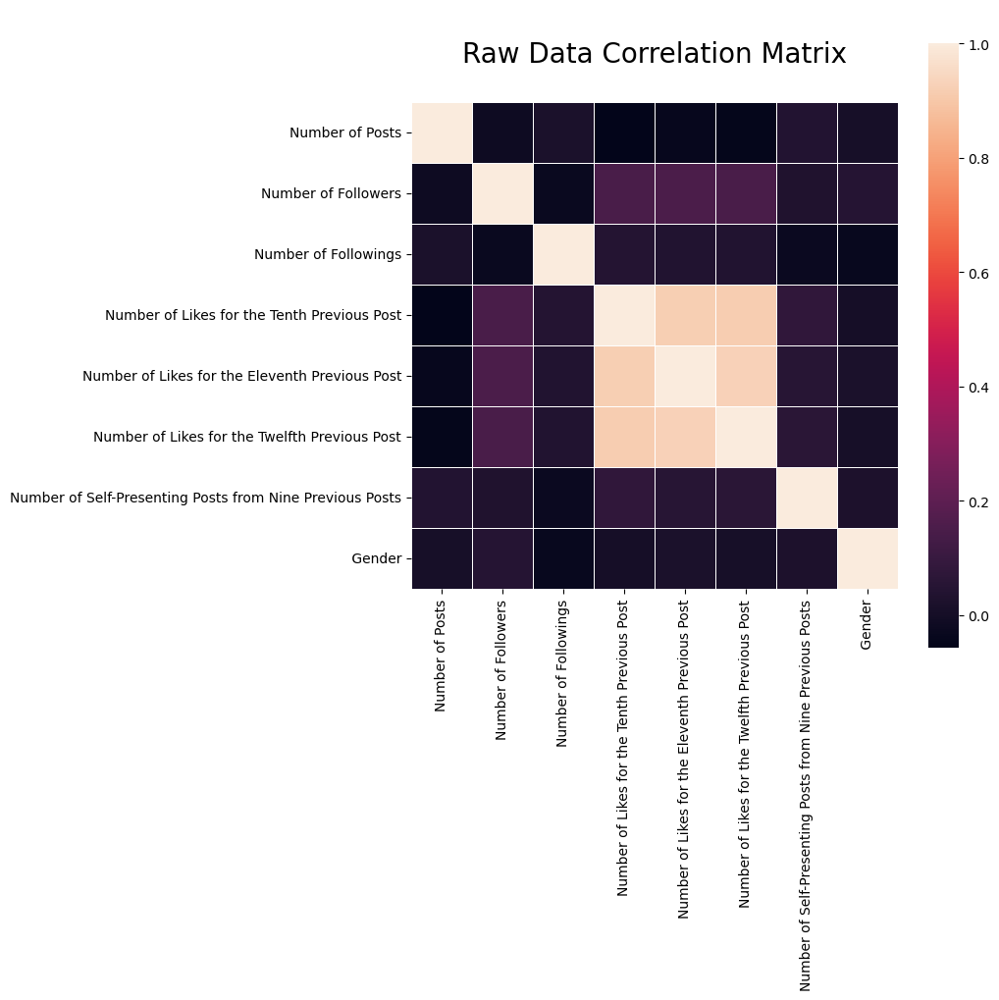

In [10]:
plt.figure(figsize=(df.corr().shape))
sns.color_palette("Spectral", as_cmap=True)
sns.heatmap(df.corr(), linewidths=.5, square = True)
plt.title("\nRaw Data Correlation Matrix\n", size = 20)

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is depre

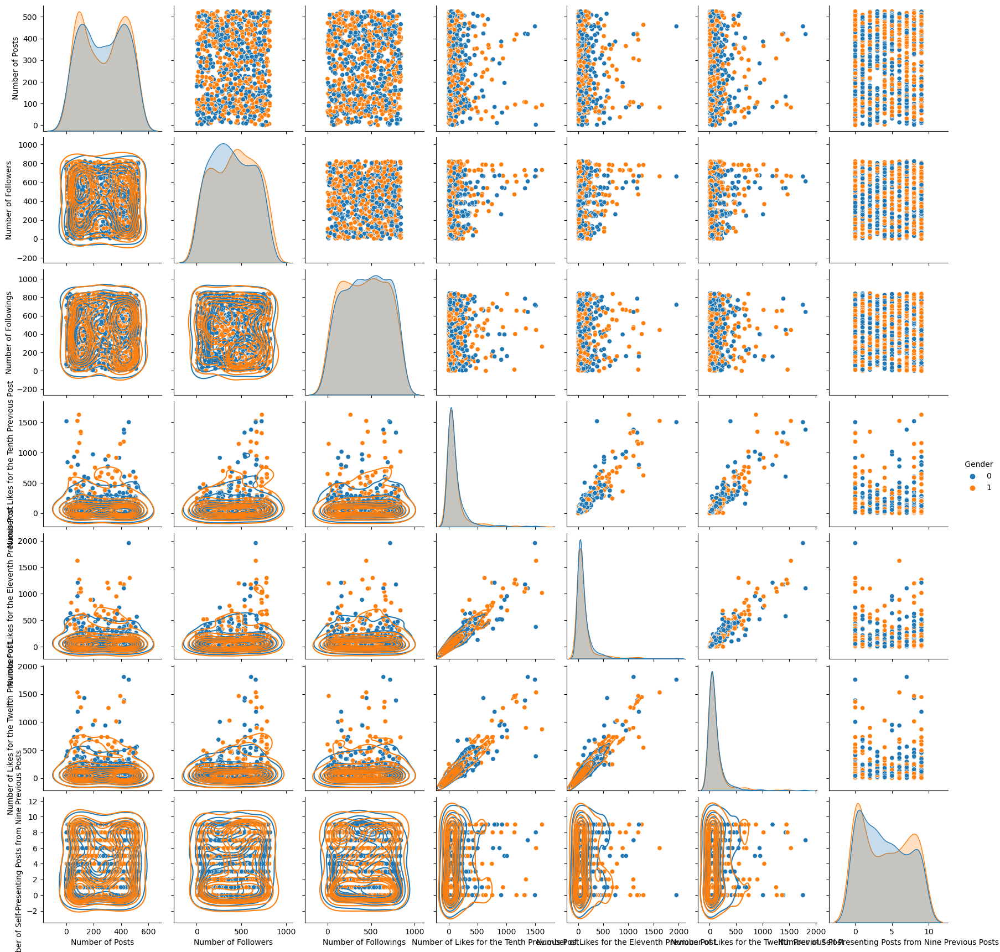

In [11]:
pairGrid = sns.pairplot(data = df, hue = " Gender")
pairGrid.map_lower(sns.kdeplot)

In [12]:
scaler = StandardScaler()
scaler.fit(df)
dfStd = scaler.transform(df)
dfStd = pd.DataFrame(dfStd, columns = df.columns)
dfStd

,Number of Posts,Number of Followers,Number of Followings,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts,Gender
0,0.494002,-0.234207,-0.984735,-0.504211,-0.532133,-0.485006,-1.262801,1.0
1,0.239000,0.549410,-0.033081,1.241934,1.700732,1.550649,-1.262801,-1.0
2,0.423876,0.407326,-0.362658,-0.251146,-0.230956,0.168781,-0.004404,-1.0
3,-1.067883,-1.487133,-1.400826,-0.311882,-0.469821,-0.395853,-0.319004,1.0
4,1.220757,1.621502,0.366531,2.573052,6.161269,2.125189,-1.262801,1.0
...,...,...,...,...,...,...,...,...
995,-0.736381,-0.535598,1.194593,-0.483965,-0.298461,-0.351277,-1.262801,-1.0
996,-0.781006,0.204963,-0.535686,0.229676,0.267544,0.421381,0.624794,-1.0
997,-1.004133,-0.669071,0.996847,-0.392862,-0.433472,-0.331465,0.939393,-1.0
998,1.469383,-0.212679,1.309945,-0.428291,-0.552904,-0.480053,-0.004404,-1.0


In [13]:
px.box(dfStd)

Text(0.5, 1.0, '\nStandardScaled Data Correlation Matrix\n')

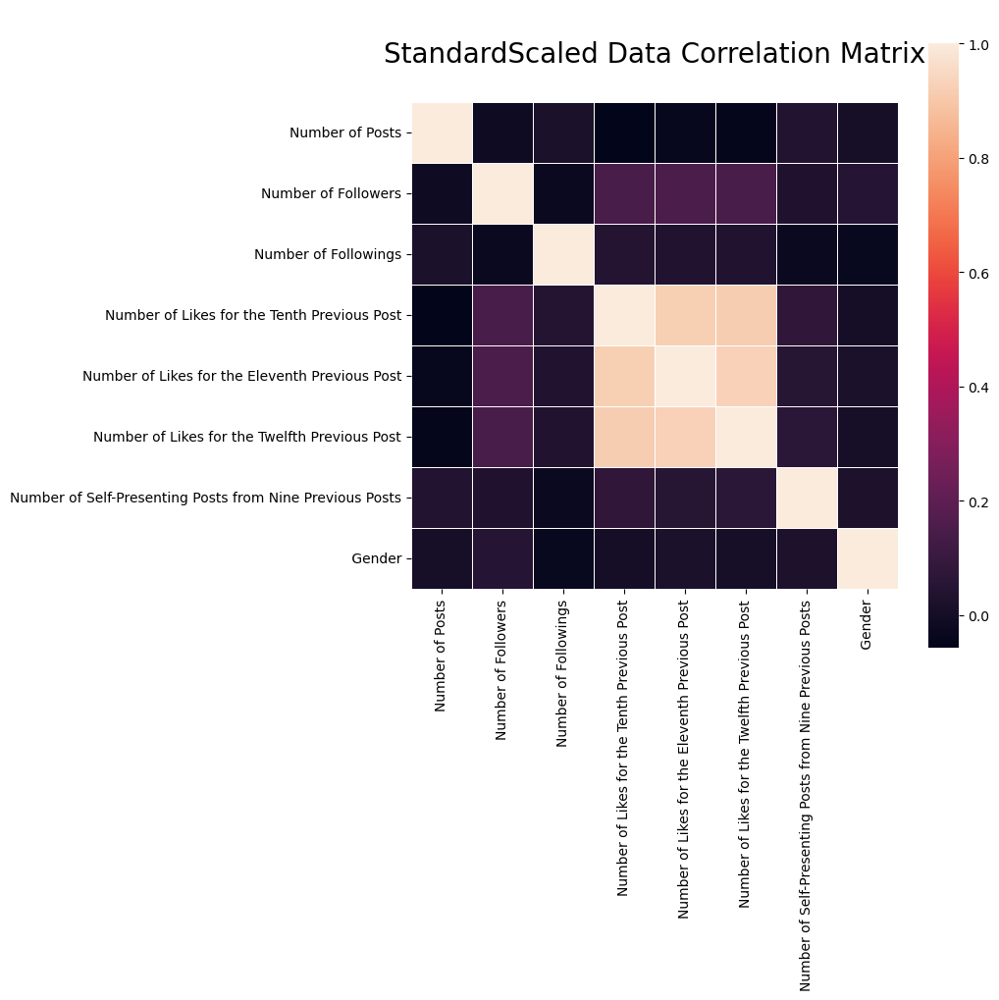

In [14]:
plt.figure(figsize=(df.corr().shape))
sns.heatmap(dfStd.corr(), linewidths=.5, square = True)
plt.title("\nStandardScaled Data Correlation Matrix\n", size = 20)

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is depre

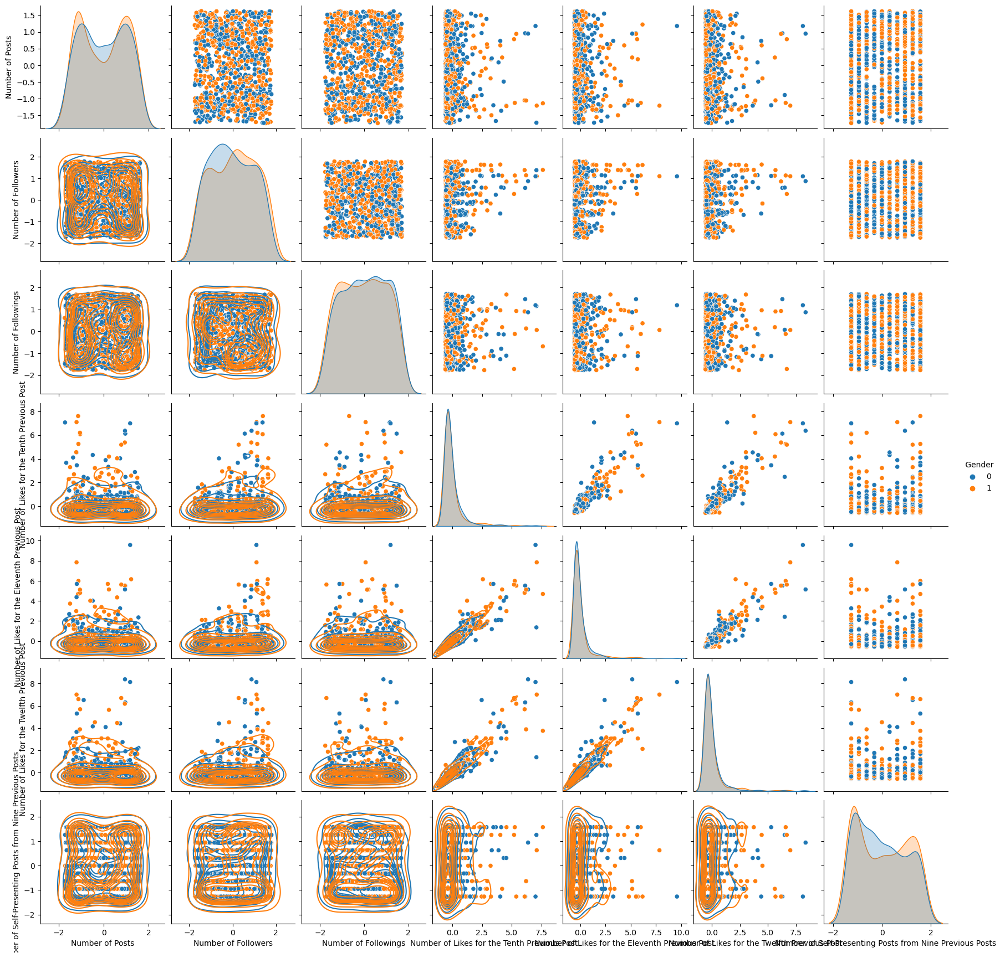

In [15]:
dfStd = dfStd.drop([' Gender'], axis = 1)
dfStd[' Gender'] = df[' Gender'].values
pairGrid = sns.pairplot(data = dfStd, hue = " Gender")
pairGrid.map_lower(sns.kdeplot)

In [16]:
normalizer = Normalizer(norm = 'l1')
normalizer.fit(df)
dfNormL1 = normalizer.transform(df)
dfNormL1 = pd.DataFrame(dfNormL1, columns = df.columns)
dfNormL1

,Number of Posts,Number of Followers,Number of Followings,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts,Gender
0,0.373662,0.376874,0.203426,0.016060,0.010707,0.018201,0.000000,0.001071
1,0.123997,0.214286,0.168941,0.144462,0.176565,0.171750,0.000000,0.000000
2,0.230559,0.341746,0.232606,0.044338,0.046385,0.101637,0.002729,0.000000
3,0.282609,0.165761,0.241848,0.144022,0.059783,0.095109,0.008152,0.002717
4,0.109430,0.185063,0.122430,0.147247,0.307020,0.128575,0.000000,0.000236
...,...,...,...,...,...,...,...,...
995,0.122353,0.221176,0.563922,0.014902,0.043137,0.034510,0.000000,0.000000
996,0.104050,0.317039,0.208799,0.111732,0.114525,0.139665,0.004190,0.000000
997,0.098531,0.216940,0.579948,0.031979,0.025065,0.041487,0.006050,0.000000
998,0.301683,0.214543,0.448918,0.018029,0.003606,0.010817,0.002404,0.000000


In [17]:
px.box(dfNormL1)

Text(0.5, 1.0, '\nManhattanDist Normalized Data Correlation Matrix\n')

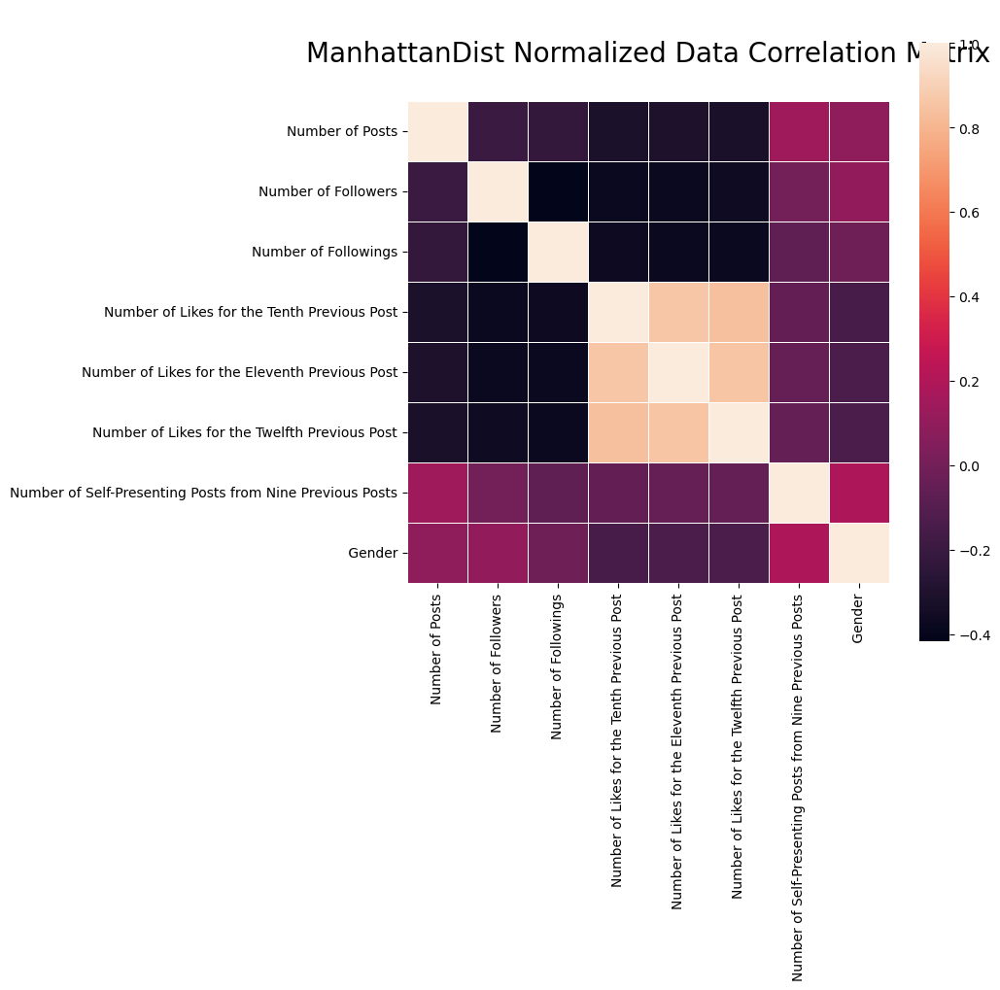

In [18]:
plt.figure(figsize=(df.corr().shape))
sns.heatmap(dfNormL1.corr(), linewidths=.5, square = True)
plt.title("\nManhattanDist Normalized Data Correlation Matrix\n", size = 20)

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is depre

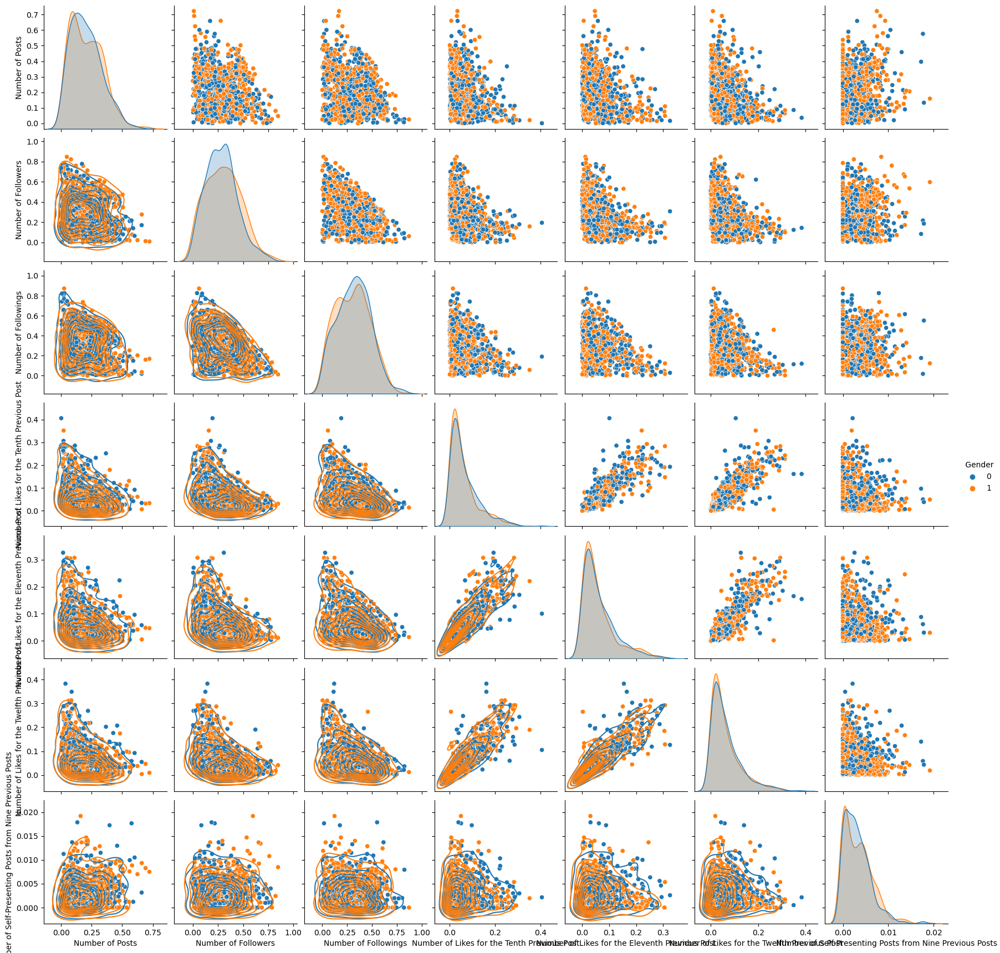

In [19]:
dfNormL1 = dfNormL1.drop([' Gender'], axis = 1)
dfNormL1[' Gender'] = df[' Gender'].values
pairGrid = sns.pairplot(data = dfNormL1, hue = " Gender")
pairGrid.map_lower(sns.kdeplot)

In [20]:
normalizer = Normalizer(norm = 'l2')
normalizer.fit(df)
dfNormL2 = normalizer.transform(df)
dfNormL2 = pd.DataFrame(dfNormL2, columns = df.columns)
dfNormL2

,Number of Posts,Number of Followers,Number of Followings,Number of Likes for the Tenth Previous Post,Number of Likes for the Eleventh Previous Post,Number of Likes for the Twelfth Previous Post,Number of Self-Presenting Posts from Nine Previous Posts,Gender
0,0.656716,0.662361,0.357525,0.028226,0.018817,0.031989,0.000000,0.001882
1,0.299526,0.517627,0.408092,0.348962,0.426509,0.414877,0.000000,0.000000
2,0.472097,0.699764,0.476287,0.090788,0.094978,0.208114,0.005587,0.000000
3,0.633088,0.371330,0.541777,0.322631,0.133922,0.213058,0.018262,0.006087
4,0.248650,0.420503,0.278187,0.334577,0.697616,0.292150,0.000000,0.000537
...,...,...,...,...,...,...,...,...
995,0.197146,0.356379,0.908641,0.024011,0.069507,0.055605,0.000000,0.000000
996,0.232628,0.708813,0.466817,0.249802,0.256047,0.312252,0.009368,0.000000
997,0.156473,0.344515,0.920994,0.050785,0.039804,0.065883,0.009608,0.000000
998,0.518121,0.368465,0.770989,0.030963,0.006193,0.018578,0.004128,0.000000


In [21]:
px.box(dfNormL2)

Text(0.5, 1.0, '\nEuclideanDist Normalized Data Correlation Matrix\n')

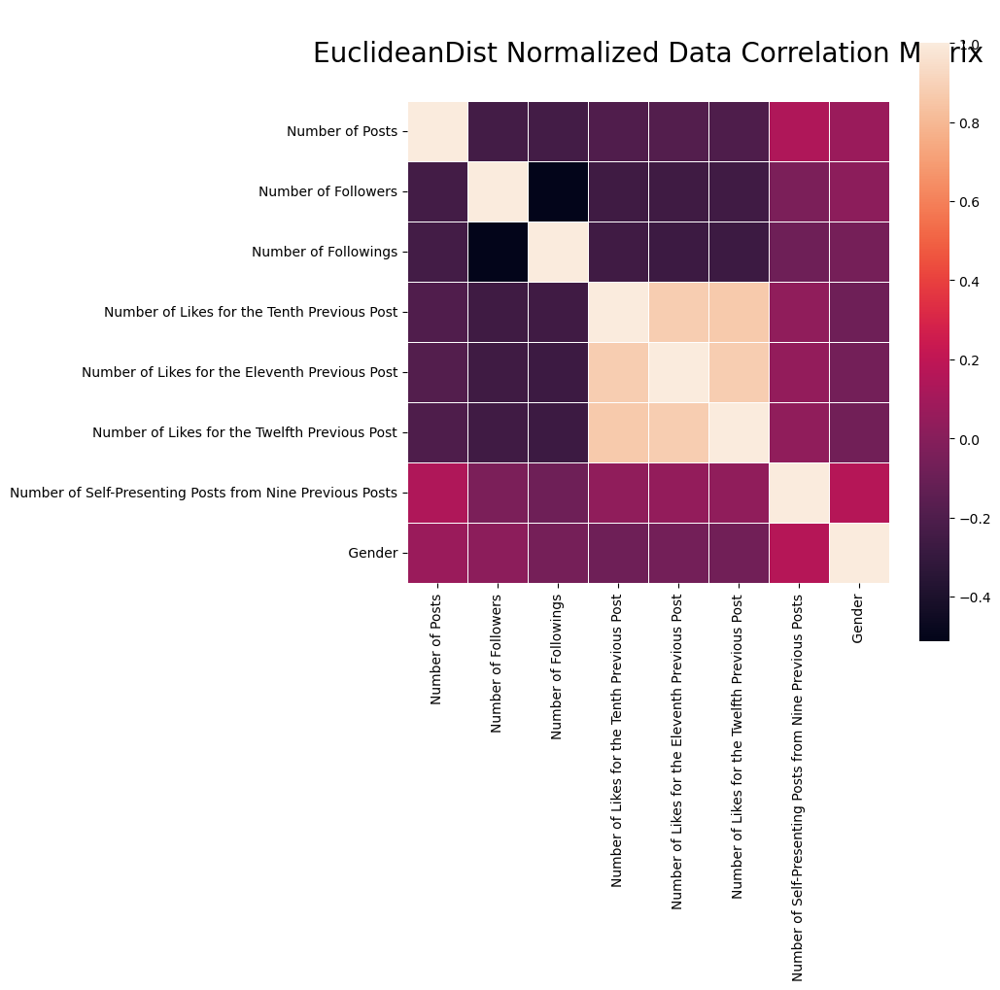

In [22]:
plt.figure(figsize=(df.corr().shape))
sns.heatmap(dfNormL2.corr(), linewidths=.5, square = True)
plt.title("\nEuclideanDist Normalized Data Correlation Matrix\n", size = 20)

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

/usr/local/anaconda3/lib/python3.9/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is depre

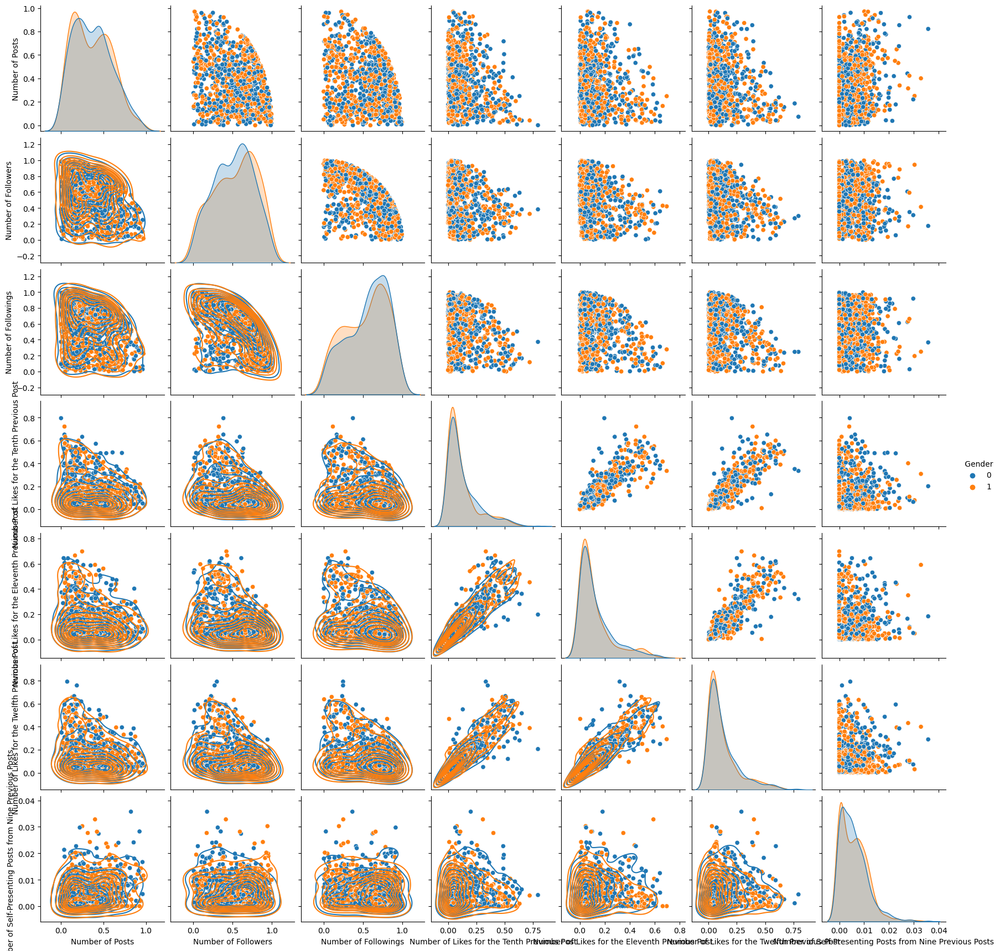

In [23]:
dfNormL2 = dfNormL2.drop([' Gender'], axis = 1)
dfNormL2[' Gender'] = df[' Gender'].values
pairGrid = sns.pairplot(data = dfNormL2, hue = " Gender")
pairGrid.map_lower(sns.kdeplot)

realStuff Comin' Up

In [36]:
scaler = StandardScaler()
scaler.fit(df.drop([' Gender'], axis = 1))
stdStuff = scaler.transform(df.drop([' Gender'], axis = 1))
stdStuff

array([[ 0.49400195, -0.23420679, -0.98473521, ..., -0.53213323,
        -0.48500598, -1.26280098],
       [ 0.2390003 ,  0.5494103 , -0.0330813 , ...,  1.70073159,
         1.55064917, -1.26280098],
       [ 0.4238765 ,  0.40732589, -0.36265841, ..., -0.23095611,
         0.16878107, -0.00440439],
       ...,
       [-1.00413276, -0.66907122,  0.99684717, ..., -0.43347176,
        -0.33146508,  0.93939306],
       [ 1.46938327, -0.21267885,  1.30994543, ..., -0.55290406,
        -0.48005305, -0.00440439],
       [ 1.32913236, -1.22018653,  0.32945352, ..., -0.41789363,
        -0.34632388,  0.31019476]])

In [37]:
targetOut = df[' Gender'].values

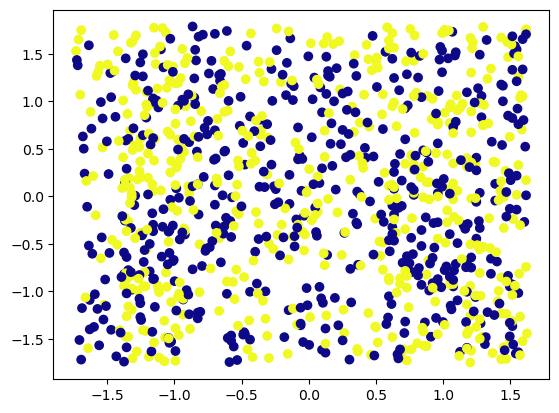

In [39]:
plt.scatter(stdStuff[:, 0], stdStuff[:, 1], c = targetOut, cmap = 'plasma')
plt.show()

In [41]:
xTrain, xTest, yTrain, yTest = train_test_split(stdStuff, targetOut, test_size = 0.2, random_state = 42)

In [43]:
regModel = LogisticRegression()
regModel.fit(xTrain, yTrain)
regScore = regModel.score(xTest, yTest)
regScore

0.525

In [44]:
regPred = regModel.predict(xTest)
regPred

array([1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 1,
       0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 0])

In [46]:
regCM = metrics.confusion_matrix(yTest, regPred)
regCM

array([[44, 61],
       [34, 61]])

In [48]:
regAccuracy = metrics.accuracy_score(yTest, regPred)
print('Accuracy: ', regAccuracy)
regPrecision = metrics.precision_score(yTest, regPred, average = 'macro')
print('Precision: ', regPrecision)
regRecall = metrics.recall_score(yTest, regPred, average = 'macro')
print('Recall: ', regRecall)
regF1 = metrics.f1_score(yTest, regPred, average = 'macro')
print('F1 Score: ', regF1)

Accuracy:  0.525
Precision:  0.532051282051282
Recall:  0.5305764411027569
F1 Score:  0.5215431492533555


Text(0.5, 1.0, 'LogisticRegression (Before PCA) \nAccuracy: 0.525, Precision: 0.532051282051282\nRecall: 0.5305764411027569, F1_Score: 0.5215431492533555 ')

<Figure size 200x200 with 0 Axes>

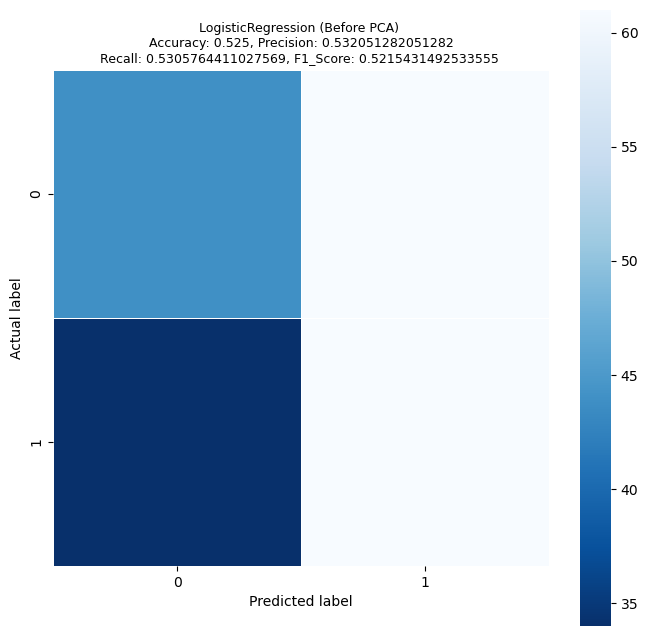

In [59]:
plt.figure(figsize=(regCM.shape))
plt.figure(figsize=(df.corr().shape))
sns.heatmap(regCM, linewidths=.5, square = True, cmap = 'Blues_r')
plt.ylabel('Actual label');
plt.xlabel('Predicted label');
titleStuff = 'LogisticRegression (Before PCA) \nAccuracy: {0}, Precision: {1}\nRecall: {2}, F1_Score: {3} '.format(regAccuracy, regPrecision, regRecall, regF1)
plt.title(titleStuff, size = 9)

In [55]:
rfModel = RandomForestClassifier()
rfModel.fit(xTrain, yTrain)
rfScore = rfModel.score(xTest, yTest)
rfScore

0.51

In [56]:
rfPred = rfModel.predict(xTest)
rfPred

array([1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1,
       0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1,
       1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 0])

In [57]:
rfCM = metrics.confusion_matrix(yTest, rfPred)
rfCM

array([[46, 59],
       [39, 56]])

In [58]:
rfAccuracy = metrics.accuracy_score(yTest, rfPred)
print('Accuracy: ', rfAccuracy)
rfPrecision = metrics.precision_score(yTest, rfPred, average = 'macro')
print('Precision: ', rfPrecision)
rfRecall = metrics.recall_score(yTest, rfPred, average = 'macro')
print('Recall: ', rfRecall)
rfF1 = metrics.f1_score(yTest, rfPred, average = 'macro')
print('F1 Score: ', rfF1)

Accuracy:  0.51
Precision:  0.5140664961636828
Recall:  0.5137844611528821
F1 Score:  0.5087719298245614


Text(0.5, 1.0, 'RandomForest with ABN (Before PCA) \nAccuracy: 0.51, Precision: 0.5140664961636828\nRecall: 0.5137844611528821, F1_Score: 0.5087719298245614 ')

<Figure size 200x200 with 0 Axes>

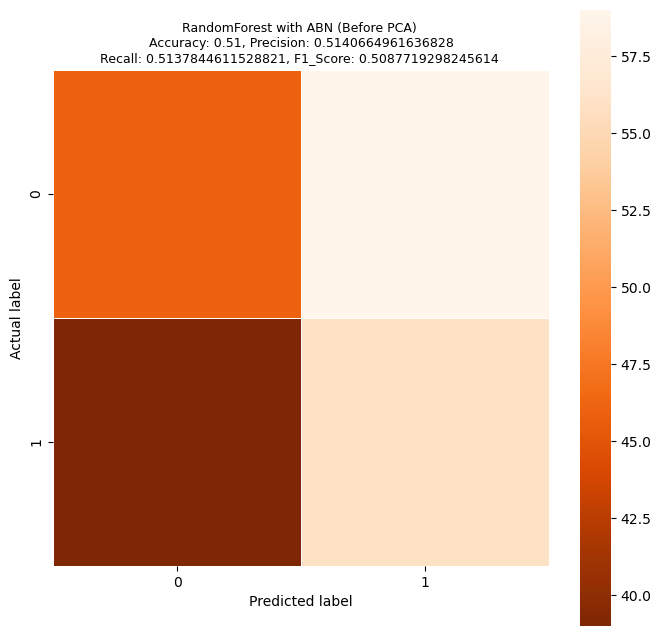

In [61]:
plt.figure(figsize=(rfCM.shape))
plt.figure(figsize=(df.corr().shape))
sns.heatmap(rfCM, linewidths=.5, square = True, cmap = 'Oranges_r')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
titleStuff = 'RandomForest with ABN (Before PCA) \nAccuracy: {0}, Precision: {1}\nRecall: {2}, F1_Score: {3} '.format(rfAccuracy, rfPrecision, rfRecall, rfF1)
plt.title(titleStuff, size = 9)

In [70]:
knnModel = KNeighborsClassifier(n_neighbors=25)
knnModel.fit(xTrain, yTrain)
knnScore = knnModel.score(xTest, yTest)
knnScore

0.565

In [71]:
knnPred = knnModel.predict(xTest)
knnPred

array([0, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0,
       1, 0, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1,
       0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0,
       1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0,
       0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 0,
       0, 0])

In [72]:
knnCM = metrics.confusion_matrix(yTest, knnPred)
knnCM

array([[57, 48],
       [39, 56]])

In [73]:
knnAccuracy = metrics.accuracy_score(yTest, knnPred)
print('Accuracy: ', knnAccuracy)
knnPrecision = metrics.precision_score(yTest, knnPred, average = 'macro')
print('Precision: ', knnPrecision)
knnRecall = metrics.recall_score(yTest, knnPred, average = 'macro')
print('Recall: ', knnRecall)
knnF1 = metrics.f1_score(yTest, knnPred, average = 'macro')
print('F1 Score: ', knnF1)

Accuracy:  0.565
Precision:  0.5661057692307692
Recall:  0.5661654135338345
F1 Score:  0.5649891247281182


Text(0.5, 1.0, 'KNN (Before PCA) \nAccuracy: 0.565, Precision: 0.5661057692307692\nRecall: 0.5661654135338345, F1_Score: 0.5649891247281182 ')

<Figure size 200x200 with 0 Axes>

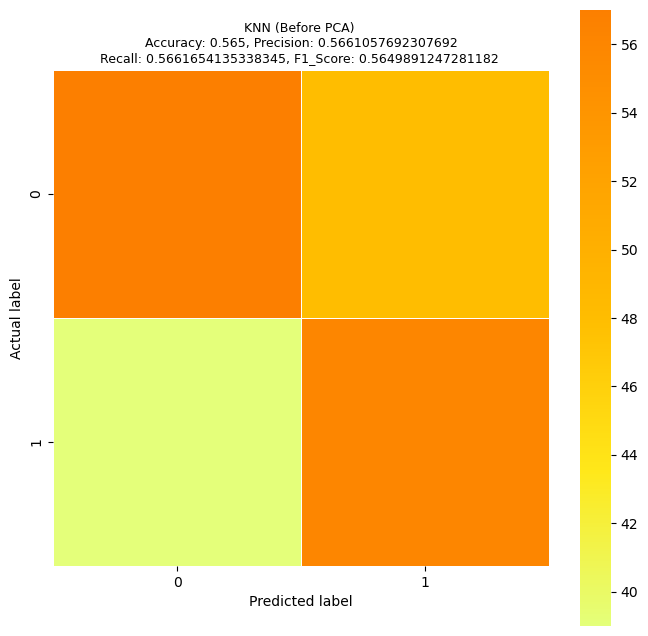

In [76]:
plt.figure(figsize=(knnCM.shape))
plt.figure(figsize=(df.corr().shape))
sns.heatmap(knnCM, linewidths=.5, square = True, cmap = 'Wistia')
plt.ylabel('Actual label')
plt.xlabel('Predicted label')
titleStuff = 'KNN (Before PCA) \nAccuracy: {0}, Precision: {1}\nRecall: {2}, F1_Score: {3} '.format(knnAccuracy, knnPrecision, knnRecall, knnF1)
plt.title(titleStuff, size = 9)

In [78]:
pca = PCA(0.95)
pca.fit(stdStuff)

PCA(n_components=0.95)

In [81]:
xPca = pca.transform(stdStuff)
print(xPca)
print('\n\n',xPca.shape)

[[-1.02346506 -0.13300733  0.49641808 -0.36697078  1.4786601 ]
 [ 2.55395655 -0.68776643  0.33321667 -0.84388064  0.94363638]
 [-0.15353253  0.48517033 -0.02331713 -0.42188164  0.27297831]
 ...
 [-0.62231852 -0.45464648 -0.20510902  1.02581915 -1.44541359]
 [-0.88475315 -0.49301761 -1.76008634 -0.70627503 -0.08639875]
 [-0.79365083 -0.11584094 -1.59545307  0.51156001  0.61391027]]


 (1000, 5)


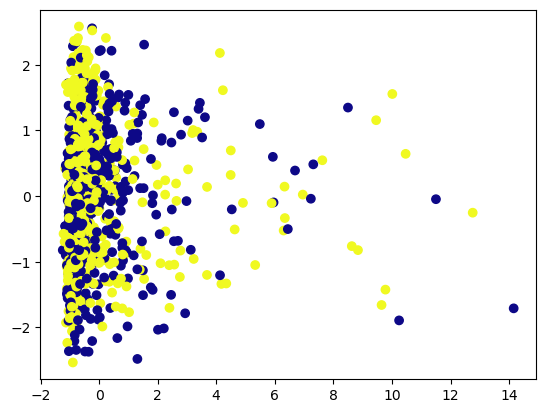

In [82]:
plt.scatter(xPca[:, 0], xPca[:, 1], c = targetOut, cmap = 'plasma')
plt.show()

In [83]:
fig = px.scatter_3d(xPca, x = xPca[:, 0], y = xPca[:, 1], z = xPca[:, 2], color = targetOut)
fig.show()

In [85]:
pca.components_

array([[-0.0432912 ,  0.13501717,  0.03151032,  0.56902583,  0.57114973,
         0.57067246,  0.05686704],
       [ 0.23508961,  0.37944345, -0.61472707, -0.03140149, -0.03754601,
        -0.03363787,  0.64756382],
       [-0.75628199,  0.28620373, -0.47399372, -0.02183456, -0.02240524,
        -0.02018837, -0.34650919],
       [-0.36340259, -0.80558127, -0.2120961 ,  0.05603852,  0.03481751,
         0.04319841,  0.40960217],
       [ 0.48847807, -0.32696224, -0.59279106,  0.04955754,  0.07836918,
         0.07288157, -0.53774922]])

In [86]:
pca.explained_variance_ratio_

array([0.41294303, 0.14963499, 0.14733807, 0.13482929, 0.13299096])

In [91]:
dfPca = pd.DataFrame(pca.components_, columns = df.drop([' Gender'], axis = 1).columns)
dfPca

TypeError: 'method' object is not subscriptable

In [80]:
pca_xTrain, pca_xTest, pca_yTrain, pca_yTest = train_test_split(xPca, targetOut, test_size = 0.2, random_state = 42)